<a href="https://colab.research.google.com/github/frederick0329/TracIn/blob/master/imagenet/resnet50_imagenet_proponents_opponents.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A-Mazing Proponents and Opponents [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/frederick0329/TrackIn/blob/master/imagenet/resnet50_imagenet_proponents_opponents.ipynb)



*   ![A-Maze of interest](https://user-images.githubusercontent.com/3983652/86517275-8892d380-bddc-11ea-83b0-eea69408a4cd.jpeg)
*   This colab shows an application of [TrackIn](https://arxiv.org/abs/2002.08484) - Proponents and Opponents in the training data of an example given a function of interest. The function of interest in this colab is the loss function of the example.
*   This colab allows you to find examples in training data which would decrease (proponents) or increase (opponents) the loss function of a given example. 
*   Imagenet subset (10%) is used due to colab default RAM size (12G). To run the full imagenet, around 40G of RAM is required.     

To Run

*   Runtime -> Change Runtime Type -> TPU 


To adapt to your own data/model
  *   Load your own model and select checkpoints. 
  *   Pick weights.
  *   Replace loss function.
  *   Write your own dataset loader.
  *   [FAQ](https://drive.google.com/file/d/1zL3hwW4wFru49_-zwpmliRDdCahjumXa/view)







# Define varaibles

In [ ]:
IMAGENET_TFDS_DIR = "tensorflow_datasets" #@param {type:"string"}
IMAGENET_TRAIN = "imagenet/train" #@param {type:"string"}
IMAGENET_VAL = "imagenet/validation" #@param {type:"string"}
CHECKPOINTS_PATH_FORMAT = "ckpt{}" #@param {type:"string"}

## Auth if your data is stored on gcs

In [ ]:
from google.colab import auth
auth.authenticate_user()  

# Clone git

In [ ]:
!git clone https://github.com/frederick0329/TrackIn

# Import and Utils

In [ ]:
# @title Imports
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.image as mpimg
import io
import json
import numpy as np
import time
import datetime
import matplotlib.pyplot as plt
import functools
sys.path.insert(0, "./TrackIn/imagenet/resnet50")
import resnet

In [ ]:
#@title Connect to TPU
try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
strategy = tf.distribute.experimental.TPUStrategy(tpu)

In [ ]:
#@title Dataset Utils

def _train_filename2id(filename):
  filename = tf.strings.regex_replace(filename, "n", "")
  filename = tf.strings.regex_replace(filename, ".JPEG", "")
  filename_split = tf.strings.split(filename, "_")
  fileid = tf.strings.to_number(filename_split, tf.int32)
  return fileid

def _val_filename2id(filename):
  filename = tf.strings.regex_replace(filename, "ILSVRC2012_val_", "")
  filename = tf.strings.regex_replace(filename, ".JPEG", "")
  fileid = tf.strings.to_number(filename, tf.int32)
  return fileid  

def _resize_image(image_bytes: tf.Tensor,
                 height: int = 224,
                 width: int = 224) -> tf.Tensor:
  """Resizes an image to a given height and width."""
  return tf.compat.v1.image.resize(
      image_bytes, [height, width], method=tf.image.ResizeMethod.BILINEAR,
      align_corners=False) 

# Calculated from the ImageNet training set
MEAN_RGB = (0.485 * 255, 0.456 * 255, 0.406 * 255)
STDDEV_RGB = (0.229 * 255, 0.224 * 255, 0.225 * 255)

def mean_image_subtraction(
    image_bytes,
    means,
    num_channels = 3,
    dtype = tf.float32,
):
  """Subtracts the given means from each image channel.

  For example:
    means = [123.68, 116.779, 103.939]
    image_bytes = mean_image_subtraction(image_bytes, means)

  Note that the rank of `image` must be known.

  Args:
    image_bytes: a tensor of size [height, width, C].
    means: a C-vector of values to subtract from each channel.
    num_channels: number of color channels in the image that will be distorted.
    dtype: the dtype to convert the images to. Set to `None` to skip conversion.

  Returns:
    the centered image.

  Raises:
    ValueError: If the rank of `image` is unknown, if `image` has a rank other
      than three or if the number of channels in `image` doesn't match the
      number of values in `means`.
  """
  if image_bytes.get_shape().ndims != 3:
    raise ValueError('Input must be of size [height, width, C>0]')

  if len(means) != num_channels:
    raise ValueError('len(means) must match the number of channels')

  # We have a 1-D tensor of means; convert to 3-D.
  # Note(b/130245863): we explicitly call `broadcast` instead of simply
  # expanding dimensions for better performance.
  means = tf.broadcast_to(means, tf.shape(image_bytes))
  if dtype is not None:
    means = tf.cast(means, dtype=dtype)

  return image_bytes - means


def standardize_image(
    image_bytes,
    stddev,
    num_channels = 3,
    dtype = tf.float32,
):
  """Divides the given stddev from each image channel.

  For example:
    stddev = [123.68, 116.779, 103.939]
    image_bytes = standardize_image(image_bytes, stddev)

  Note that the rank of `image` must be known.

  Args:
    image_bytes: a tensor of size [height, width, C].
    stddev: a C-vector of values to divide from each channel.
    num_channels: number of color channels in the image that will be distorted.
    dtype: the dtype to convert the images to. Set to `None` to skip conversion.

  Returns:
    the centered image.

  Raises:
    ValueError: If the rank of `image` is unknown, if `image` has a rank other
      than three or if the number of channels in `image` doesn't match the
      number of values in `stddev`.
  """
  if image_bytes.get_shape().ndims != 3:
    raise ValueError('Input must be of size [height, width, C>0]')

  if len(stddev) != num_channels:
    raise ValueError('len(stddev) must match the number of channels')

  # We have a 1-D tensor of stddev; convert to 3-D.
  # Note(b/130245863): we explicitly call `broadcast` instead of simply
  # expanding dimensions for better performance.
  stddev = tf.broadcast_to(stddev, tf.shape(image_bytes))
  if dtype is not None:
    stddev = tf.cast(stddev, dtype=dtype)

  return image_bytes / stddev   

# TPU does not allow tf.string and images with various size. Therefore, decode 
# and cropping cannot happen in the model.
def _preprocess(inputs, split='train', image_size=224, crop_padding=32):
  """Apply image preprocessing."""
  filename = inputs['file_name']
  image = inputs['image']
  label = inputs['label']
  if split == 'train':
    fileid = _train_filename2id(filename)
  else:      
    fileid = _val_filename2id(filename)
  shape = tf.shape(image)
  image_height = shape[0]
  image_width = shape[1]

  padded_center_crop_size = tf.cast(
      ((image_size / (image_size + crop_padding)) *
       tf.cast(tf.minimum(image_height, image_width), tf.float32)),
      tf.int32)

  offset_height = ((image_height - padded_center_crop_size) + 1) // 2
  offset_width = ((image_width - padded_center_crop_size) + 1) // 2
  crop_window = tf.stack([offset_height, offset_width,
                          padded_center_crop_size, padded_center_crop_size])
  
  image = tf.image.crop_to_bounding_box(
        image,
        offset_height=offset_height,
        offset_width=offset_width,
        target_height=padded_center_crop_size,
        target_width=padded_center_crop_size)
  image = _resize_image(image_bytes=image,
                        height=image_size,
                        width=image_size)
  image = mean_image_subtraction(
        image, MEAN_RGB)
  image = standardize_image(
        image, STDDEV_RGB)

  image = tf.cast(image, tf.float32)
  label = tf.cast(label, tf.int32)
  return fileid, image, label  


def make_get_dataset(split, batch_size):
  def get_dataset(
      input_context: tf.distribute.InputContext = None) -> tf.data.Dataset:
    builder = tfds.builder(name='imagenet2012_subset/10pct', data_dir=IMAGENET_TFDS_DIR)
    builder.download_and_prepare()

    read_config = tfds.ReadConfig(
        interleave_block_length=1)

    _preprocess_fn = functools.partial(_preprocess, split=split)

    ds = builder.as_dataset(
        split=split,
        as_supervised=False,
        shuffle_files=False,
        read_config=read_config)
    ds = ds.map(_preprocess_fn,
                num_parallel_calls=tf.data.experimental.AUTOTUNE)
    ds = ds.batch(batch_size)

    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds
  return get_dataset  

In [ ]:
#@title Search Utils

def find(loss_grad=None, activation=None, topk=50):
  if loss_grad is None and activation is None:
    raise ValueError('loss grad and activation cannot both be None.')
  scores = []
  scores_lg = []
  scores_a = []
  for i in range(len(trackin_train['image_ids'])):
    if loss_grad is not None and activation is not None:
      lg_sim = np.sum(trackin_train['loss_grads'][i] * loss_grad, axis=0)
      a_sim = np.sum(trackin_train['activations'][i] * activation, axis=0)
      scores.append(np.sum(lg_sim * a_sim))
      scores_lg.append(np.sum(lg_sim))
      scores_a.append(np.sum(a_sim))
    elif loss_grad is not None:
      scores.append(np.sum(trackin_train['loss_grads'][i] * loss_grad))
    elif activation is not None:
      scores.append(np.sum(trackin_train['activations'][i] * activation))    

  opponents = []
  proponents = []
  indices = np.argsort(scores)
  for i in range(topk):
    index = indices[-i-1]
    proponents.append((
        trackin_train['image_ids'][index],
        trackin_train['probs'][index][0],
        index_to_classname[str(trackin_train['predicted_labels'][index][0])][1],
        index_to_classname[str(trackin_train['labels'][index])][1], 
        scores[index],
        scores_lg[index] if scores_lg else None,
        scores_a[index] if scores_a else None))
    index = indices[i]
    opponents.append((
        trackin_train['image_ids'][index],
        trackin_train['probs'][index][0],
        index_to_classname[str(trackin_train['predicted_labels'][index][0])][1],
        index_to_classname[str(trackin_train['labels'][index])][1],
        scores[index],
        scores_lg[index] if scores_lg else None,
        scores_a[index] if scores_a else None))  
  return opponents, proponents

IMAGENET_LABEL_DICT = './TrackIn/imagenet/imagenet_class_index.json'
def get_id_synset_mapping():
  imagenet_class_idx_path = IMAGENET_LABEL_DICT
  with tf.io.gfile.GFile(imagenet_class_idx_path, "r") as f:
    json_str = f.read()
    index_to_classname = json.loads(json_str)
  return index_to_classname  
index_to_classname = get_id_synset_mapping()  

def get_image(split, id):
  if split == 'validation':
    filepath = '{}/ILSVRC2012_val_{fileid:08d}.JPEG'.format(IMAGENET_VAL, fileid=id)
    print('ILSVRC2012_val_{fileid:08d}.JPEG'.format(fileid=id))
  else:
    filepath = '{}/n0{}/n0{}_{}.JPEG'.format(IMAGENET_TRAIN, id[0], id[0], id[1])
    print('n0{}_{}.JPEG'.format(id[0], id[1]))  
  try:   
    with tf.io.gfile.GFile(filepath, "rb") as f:
      jpg_data = f.read()
      image = mpimg.imread(io.BytesIO(jpg_data), format='JPG')     
    return image
  except:
    print('Failed to read image {}'.format(filepath)) 

def find_and_show(trackin_dict, idx, vector='influence', idx_filename_mapping=None):
  if vector == 'influence':
    op, pp = find(trackin_dict['loss_grads'][idx], trackin_dict['activations'][idx])
  elif vector == 'encoding':
    op, pp = find(None, trackin_dict['activations'][idx])  
  elif vector == 'error':
    op, pp = find(trackin_dict['loss_grads'][idx], None)
  else:
    raise ValueError('Unsupported vector type.')  
  print('Query image from validation: ')
  print('label: {}, prob: {}, predicted_label: {}'.format(
      index_to_classname[str(trackin_dict['labels'][idx])][1], 
      trackin_dict['probs'][idx][0], 
      index_to_classname[str(trackin_dict['predicted_labels'][idx][0])][1]))
  if idx_filename_mapping:
    img = mpimg.imread(io.BytesIO(idx_filename_mapping[idx]), format='JPG')
  else:  
    img = get_image('validation', trackin_dict['image_ids'][idx])
  if img is not None:
    plt.imshow(img, interpolation='nearest')
    plt.show()
  print("="*50)  
  print('Proponents: ')
  for p in pp:
    print('label: {}, prob: {}, predicted_label: {}, influence: {}'.format(p[3], p[1], p[2], p[4]))
    if p[5] and p[6]:
      print('error_similarity: {}, encoding_similarity: {}'.format(p[5], p[6]))
    img = get_image('train', p[0])
    if img is not None:
      plt.imshow(img, interpolation='nearest')
      plt.show()  
  print("="*50)
  print('Opponents: ')
  for o in op:
    print('label: {}, prob: {}, predicted_label: {}, influence: {}'.format(o[3], o[1], o[2], o[4]))
    if o[5] and o[6]:
      print('error_similarity: {}, encoding_similarity: {}'.format(o[5], o[6]))
    img = get_image('train', o[0])
    if img is not None:
      plt.imshow(img, interpolation='nearest')
      plt.show()
  print("="*50)    

# Init models/checkpoints



* Resnet50 - 75.8% accuracy
* Pick 30, 60, 90th checkpoint 
* Model checkpoint weights are converted to saved models so the colab does not depend on model code.



In [ ]:
with strategy.scope():
  models_penultimate = []
  models_last = []
  for i in [30, 60, 90]:
    model = resnet.resnet50(1000)
    model.load_weights(CHECKPOINTS_PATH_FORMAT.format(i))
    models_penultimate.append(tf.keras.Model(model.layers[0].input, model.layers[-3].output))
    models_last.append(model.layers[-2])

# Find Proponents and Opponents for a given test example

In [ ]:
@tf.function
def run(inputs):
  imageids, images, labels = inputs
  # ignore bias for simplicity
  loss_grads = []
  activations = []
  for mp, ml in zip(models_penultimate, models_last):
    h = mp(images)
    logits = ml(h)
    probs = tf.nn.softmax(logits)
    loss_grad = tf.one_hot(labels, 1000) - probs
    activations.append(h)
    loss_grads.append(loss_grad)

  # Using probs from last checkpoint
  probs, predicted_labels = tf.math.top_k(probs, k=1)

  return imageids, tf.stack(loss_grads, axis=-1), tf.stack(activations, axis=-1), labels, probs, predicted_labels

In [ ]:
def get_trackin_grad(ds):
  image_ids_np = []
  loss_grads_np = []
  activations_np = []
  labels_np = []
  probs_np = []
  predicted_labels_np = []
  for d in ds:
    imageids_replicas, loss_grads_replica, activations_replica, labels_replica, probs_replica, predictied_labels_replica = strategy.run(run, args=(d,))
    for imageids, loss_grads, activations, labels, probs, predicted_labels in zip(
        strategy.experimental_local_results(imageids_replicas), 
        strategy.experimental_local_results(loss_grads_replica),
        strategy.experimental_local_results(activations_replica), 
        strategy.experimental_local_results(labels_replica), 
        strategy.experimental_local_results(probs_replica), 
        strategy.experimental_local_results(predictied_labels_replica)):
      if imageids.shape[0] == 0:
        continue
      image_ids_np.append(imageids.numpy())
      loss_grads_np.append(loss_grads.numpy())
      activations_np.append(activations.numpy())
      labels_np.append(labels.numpy())
      probs_np.append(probs.numpy())
      predicted_labels_np.append(predicted_labels.numpy()) 
  return {'image_ids': np.concatenate(image_ids_np),
          'loss_grads': np.concatenate(loss_grads_np),
          'activations': np.concatenate(activations_np),
          'labels': np.concatenate(labels_np),
          'probs': np.concatenate(probs_np),
          'predicted_labels': np.concatenate(predicted_labels_np)
         }    

## Build Imagenet Train Vectors



In [ ]:
ds_train = strategy.experimental_distribute_datasets_from_function(make_get_dataset('train', 512))

In [ ]:
start = time.time()
trackin_train = get_trackin_grad(ds_train)
end = time.time()
print(datetime.timedelta(seconds=end - start))

0:01:33.073536


## Build Imagenet Val Vectors

In [ ]:
ds_val = strategy.experimental_distribute_datasets_from_function(make_get_dataset('validation', 512))

In [ ]:
start = time.time()
trackin_val = get_trackin_grad(ds_val)
end = time.time()
print(datetime.timedelta(seconds=end - start))

## Pick an index from Validation Set

Query image from validation: 
label: maze, prob: 0.9435696005821228, predicted_label: maze
ILSVRC2012_val_00016418.JPEG


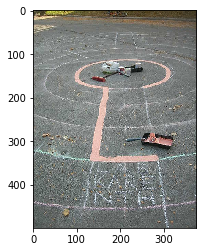

Proponents: 
label: maze, prob: 0.9880332350730896, predicted_label: maze, influence: 1013.73291015625
error_similarity: 0.3505588173866272, encoding_similarity: 2891.7626953125
n03733281_16197.JPEG


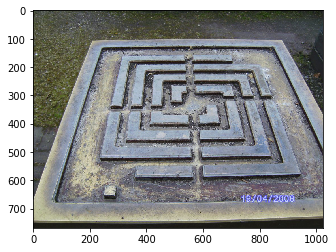

label: maze, prob: 0.9998985528945923, predicted_label: maze, influence: 915.48388671875
error_similarity: 0.3481355607509613, encoding_similarity: 2629.676513671875
n03733281_10529.JPEG


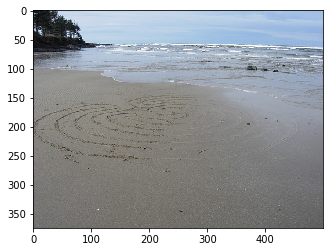

label: maze, prob: 0.9999992847442627, predicted_label: maze, influence: 902.573974609375
error_similarity: 0.27058419585227966, encoding_similarity: 3335.649169921875
n03733281_8711.JPEG


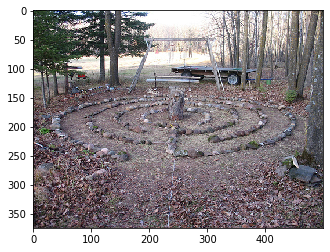

label: maze, prob: 0.9982917904853821, predicted_label: maze, influence: 856.32666015625
error_similarity: 0.33447012305259705, encoding_similarity: 2560.24853515625
n03733281_30009.JPEG


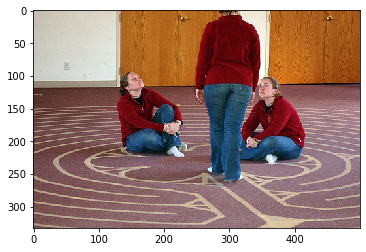

label: maze, prob: 0.9975507855415344, predicted_label: maze, influence: 825.5210571289062
error_similarity: 0.29993706941604614, encoding_similarity: 2752.314208984375
n03733281_11529.JPEG


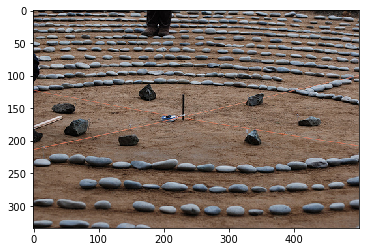

label: maze, prob: 0.9998034834861755, predicted_label: maze, influence: 821.9034423828125
error_similarity: 0.34948867559432983, encoding_similarity: 2351.731201171875
n03733281_8135.JPEG


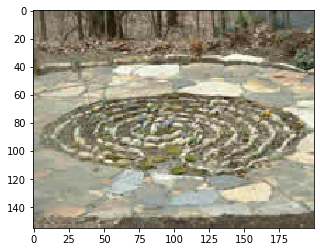

label: maze, prob: 0.9926126003265381, predicted_label: maze, influence: 809.3308715820312
error_similarity: 0.34637561440467834, encoding_similarity: 2336.570068359375
n03733281_7292.JPEG


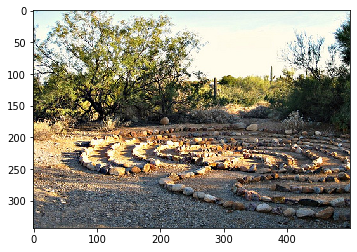

label: maze, prob: 0.9899886250495911, predicted_label: maze, influence: 784.9094848632812
error_similarity: 0.3390536308288574, encoding_similarity: 2315.0009765625
n03733281_24008.JPEG


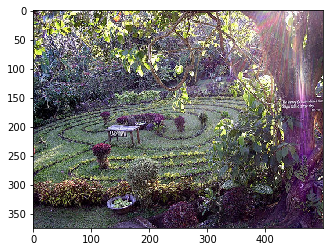

label: maze, prob: 0.9937505125999451, predicted_label: maze, influence: 776.2945556640625
error_similarity: 0.3221205174922943, encoding_similarity: 2409.95068359375
n03733281_48100.JPEG


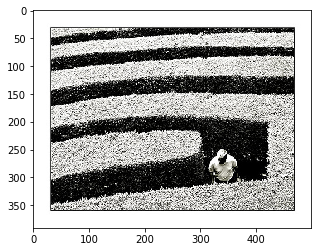

label: maze, prob: 0.9958367347717285, predicted_label: maze, influence: 758.8212280273438
error_similarity: 0.34927430748939514, encoding_similarity: 2172.565185546875
n03733281_17005.JPEG


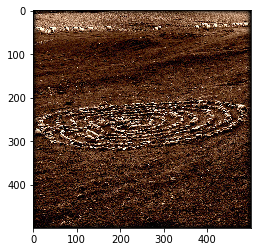

label: maze, prob: 0.9999980926513672, predicted_label: maze, influence: 744.9393310546875
error_similarity: 0.33246365189552307, encoding_similarity: 2240.6640625
n03733281_8768.JPEG


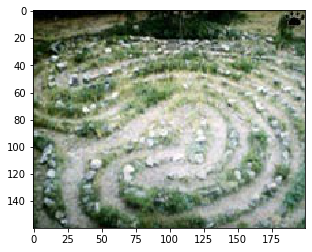

label: maze, prob: 0.5154284834861755, predicted_label: soccer_ball, influence: 740.0498046875
error_similarity: 0.35641199350357056, encoding_similarity: 2076.388671875
n03733281_25216.JPEG


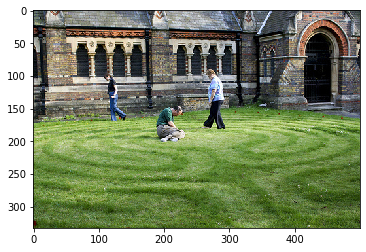

label: maze, prob: 0.9626778364181519, predicted_label: maze, influence: 731.3472290039062
error_similarity: 0.34466931223869324, encoding_similarity: 2121.880859375
n03733281_28798.JPEG


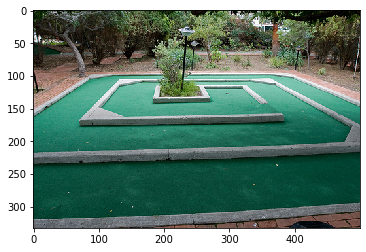

label: maze, prob: 0.9984855055809021, predicted_label: maze, influence: 712.7316284179688
error_similarity: 0.34551042318344116, encoding_similarity: 2062.8369140625
n03733281_41598.JPEG


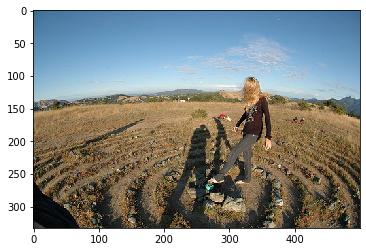

label: maze, prob: 0.9999818801879883, predicted_label: maze, influence: 689.1607666015625
error_similarity: 0.23049364984035492, encoding_similarity: 2989.933837890625
n03733281_9596.JPEG


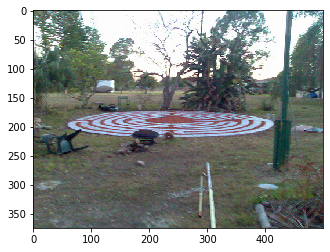

label: maze, prob: 0.9761191606521606, predicted_label: maze, influence: 679.9505615234375
error_similarity: 0.3513888418674469, encoding_similarity: 1935.037353515625
n03733281_7083.JPEG


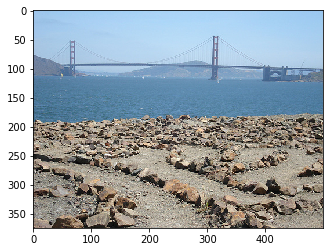

label: maze, prob: 0.9999202489852905, predicted_label: maze, influence: 663.7868041992188
error_similarity: 0.3435954749584198, encoding_similarity: 1931.884521484375
n03733281_11176.JPEG


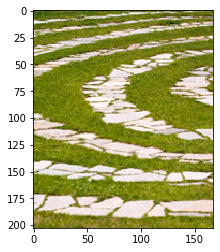

label: maze, prob: 0.569675862789154, predicted_label: maze, influence: 657.8343505859375
error_similarity: 0.37257587909698486, encoding_similarity: 1765.638671875
n03733281_8436.JPEG


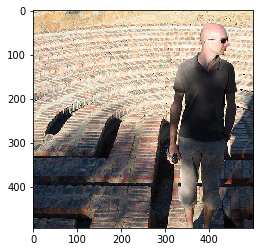

label: maze, prob: 0.9889346361160278, predicted_label: maze, influence: 656.2366943359375
error_similarity: 0.32669544219970703, encoding_similarity: 2008.7109375
n03733281_8935.JPEG


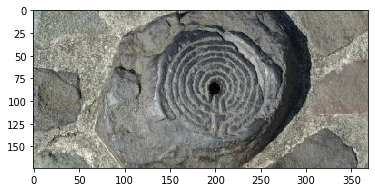

label: maze, prob: 0.999914288520813, predicted_label: maze, influence: 643.5321655273438
error_similarity: 0.3426200747489929, encoding_similarity: 1878.2674560546875
n03733281_32870.JPEG


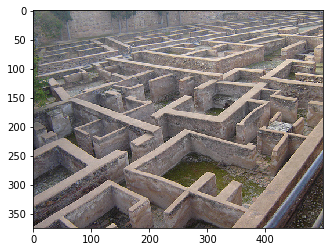

label: maze, prob: 0.9998047947883606, predicted_label: maze, influence: 633.4189453125
error_similarity: 0.34405022859573364, encoding_similarity: 1841.0653076171875
n03733281_41945.JPEG


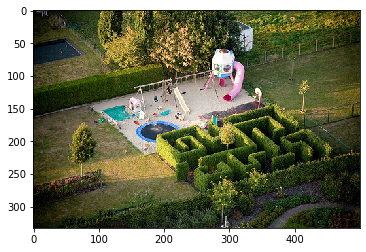

label: maze, prob: 0.99812251329422, predicted_label: maze, influence: 633.3258666992188
error_similarity: 0.32393088936805725, encoding_similarity: 1955.1265869140625
n03733281_54068.JPEG


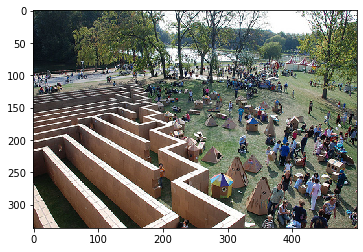

label: maze, prob: 0.9999936819076538, predicted_label: maze, influence: 618.7671508789062
error_similarity: 0.28577920794487, encoding_similarity: 2165.193115234375
n03733281_55884.JPEG


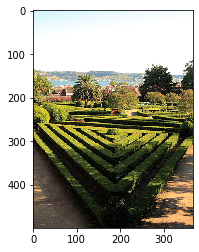

label: maze, prob: 0.738097071647644, predicted_label: maze, influence: 611.775390625
error_similarity: 0.36622488498687744, encoding_similarity: 1670.4910888671875
n03733281_36073.JPEG


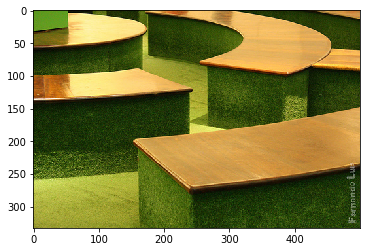

label: maze, prob: 0.7232203483581543, predicted_label: vault, influence: 608.53271484375
error_similarity: 0.4055129289627075, encoding_similarity: 1500.6494140625
n03733281_9312.JPEG


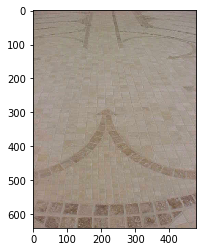

label: maze, prob: 0.7113027572631836, predicted_label: maze, influence: 607.0961303710938
error_similarity: 0.36568617820739746, encoding_similarity: 1660.1561279296875
n03733281_7542.JPEG


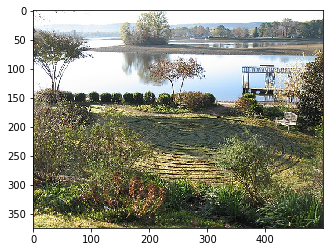

label: maze, prob: 0.9714041352272034, predicted_label: hay, influence: 590.2990112304688
error_similarity: 0.4071100354194641, encoding_similarity: 1449.97412109375
n03733281_11302.JPEG


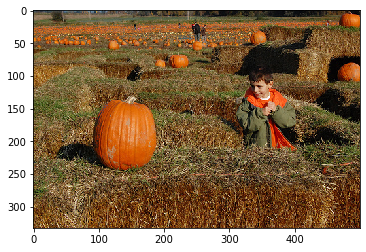

label: maze, prob: 0.9740145206451416, predicted_label: maze, influence: 587.7124633789062
error_similarity: 0.3093445599079132, encoding_similarity: 1899.863525390625
n03733281_11872.JPEG


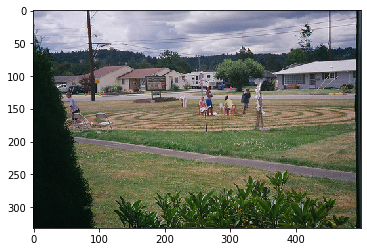

label: maze, prob: 0.9612897634506226, predicted_label: maze, influence: 585.0020141601562
error_similarity: 0.34735313057899475, encoding_similarity: 1684.1708984375
n03733281_22314.JPEG


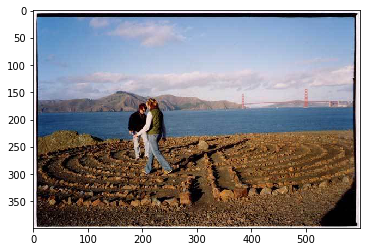

label: maze, prob: 0.9999314546585083, predicted_label: maze, influence: 579.4500122070312
error_similarity: 0.35173138976097107, encoding_similarity: 1647.421875
n03733281_3170.JPEG


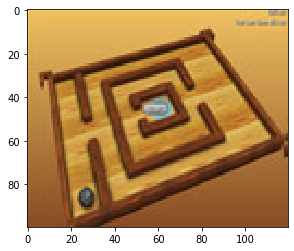

label: maze, prob: 0.8647840023040771, predicted_label: maze, influence: 577.7288208007812
error_similarity: 0.3497324585914612, encoding_similarity: 1651.91650390625
n03733281_1082.JPEG


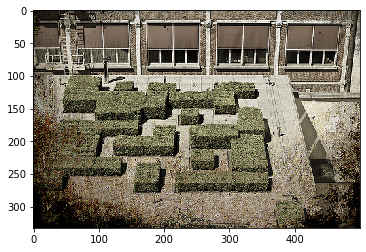

label: maze, prob: 0.9896193146705627, predicted_label: maze, influence: 572.4656982421875
error_similarity: 0.3472957909107208, encoding_similarity: 1648.3519287109375
n03733281_9464.JPEG


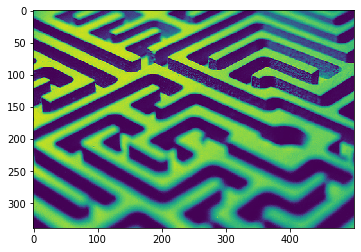

label: maze, prob: 0.453562468290329, predicted_label: maze, influence: 549.3870239257812
error_similarity: 0.37945327162742615, encoding_similarity: 1447.83837890625
n03733281_37717.JPEG


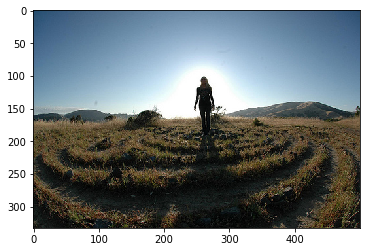

label: maze, prob: 0.9714414477348328, predicted_label: maze, influence: 546.1231079101562
error_similarity: 0.3220519721508026, encoding_similarity: 1695.7607421875
n03733281_50918.JPEG


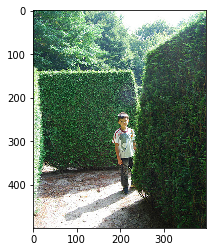

label: maze, prob: 0.9784605503082275, predicted_label: maze, influence: 544.7799072265625
error_similarity: 0.25398218631744385, encoding_similarity: 2144.953125
n03733281_24368.JPEG


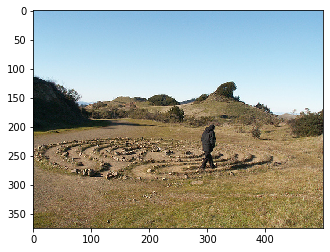

label: maze, prob: 0.9525066614151001, predicted_label: maze, influence: 541.7105102539062
error_similarity: 0.3538360893726349, encoding_similarity: 1530.964599609375
n03733281_35566.JPEG


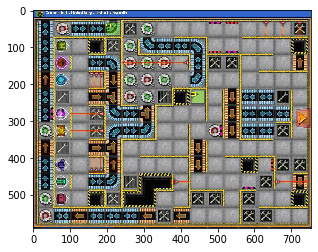

label: maze, prob: 0.9999872446060181, predicted_label: maze, influence: 534.1857299804688
error_similarity: 0.2759712338447571, encoding_similarity: 1935.6573486328125
n03733281_6170.JPEG


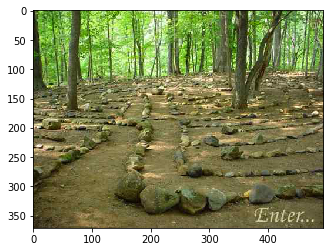

label: maze, prob: 0.9262032508850098, predicted_label: maze, influence: 532.8070678710938
error_similarity: 0.3452609181404114, encoding_similarity: 1543.201171875
n03733281_49569.JPEG


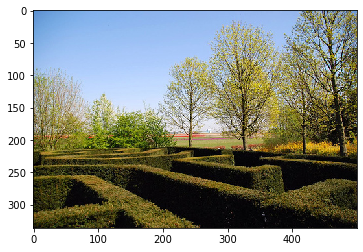

label: maze, prob: 0.9999294281005859, predicted_label: maze, influence: 510.682861328125
error_similarity: 0.34615758061408997, encoding_similarity: 1475.2901611328125
n03733281_10164.JPEG


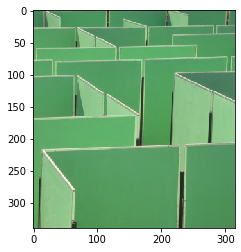

label: maze, prob: 1.0, predicted_label: maze, influence: 496.8985900878906
error_similarity: 0.191903755068779, encoding_similarity: 2589.3115234375
n03733281_31716.JPEG


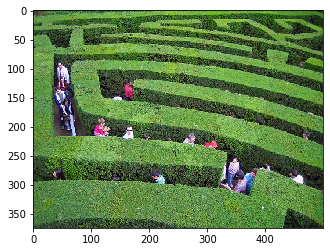

label: maze, prob: 0.713485062122345, predicted_label: maze, influence: 494.74493408203125
error_similarity: 0.3663741946220398, encoding_similarity: 1350.3814697265625
n03733281_15381.JPEG


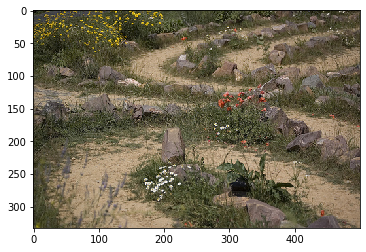

label: maze, prob: 0.9960172772407532, predicted_label: maze, influence: 485.1318054199219
error_similarity: 0.35046425461769104, encoding_similarity: 1384.2547607421875
n03733281_8229.JPEG


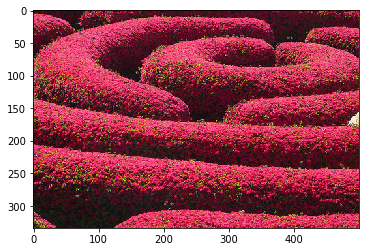

label: maze, prob: 0.9600059390068054, predicted_label: maze, influence: 483.1441650390625
error_similarity: 0.23236675560474396, encoding_similarity: 2079.23095703125
n03733281_3937.JPEG


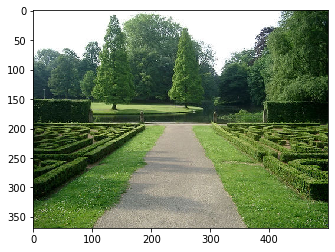

label: maze, prob: 0.9996739625930786, predicted_label: maze, influence: 465.0401916503906
error_similarity: 0.2225281149148941, encoding_similarity: 2089.80419921875
n03733281_5544.JPEG


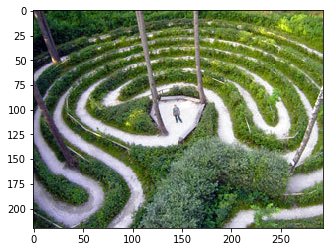

label: maze, prob: 0.2213902324438095, predicted_label: ski_mask, influence: 457.77069091796875
error_similarity: 0.40736931562423706, encoding_similarity: 1123.7239990234375
n03733281_17690.JPEG


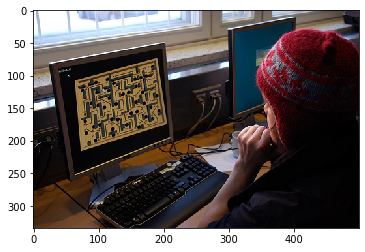

label: maze, prob: 0.31648507714271545, predicted_label: stupa, influence: 447.751708984375
error_similarity: 0.40744996070861816, encoding_similarity: 1098.912109375
n03733281_15215.JPEG


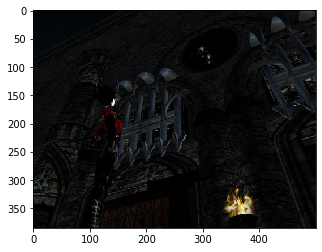

label: maze, prob: 0.9993135929107666, predicted_label: maze, influence: 442.65032958984375
error_similarity: 0.19791941344738007, encoding_similarity: 2236.51806640625
n03733281_18022.JPEG


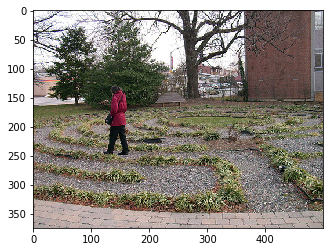

label: maze, prob: 0.2051336169242859, predicted_label: lawn_mower, influence: 438.95391845703125
error_similarity: 0.14395123720169067, encoding_similarity: 3049.32373046875
n03733281_8992.JPEG


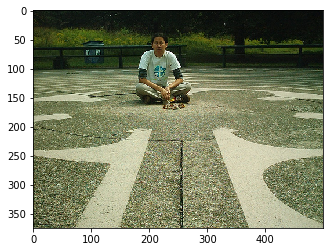

label: maze, prob: 0.9992222785949707, predicted_label: maze, influence: 438.0144958496094
error_similarity: 0.18338358402252197, encoding_similarity: 2388.515380859375
n03733281_9045.JPEG


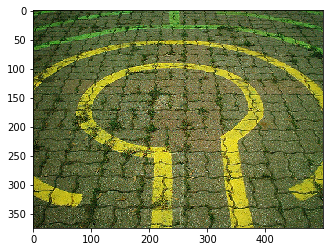

label: maze, prob: 0.9921690225601196, predicted_label: maze, influence: 423.7787170410156
error_similarity: 0.3513525426387787, encoding_similarity: 1206.1353759765625
n03733281_10899.JPEG


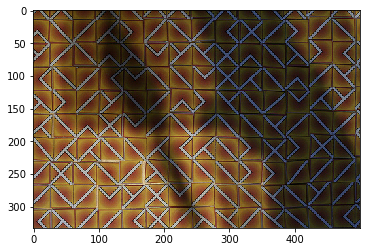

Opponents: 
label: potter's_wheel, prob: 0.983346700668335, predicted_label: potter's_wheel, influence: -1026.233642578125
error_similarity: -0.31300780177116394, encoding_similarity: 3278.6201171875
n03992509_13176.JPEG


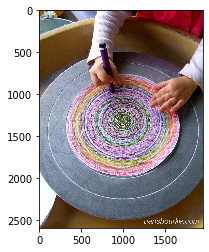

label: sundial, prob: 0.9946473836898804, predicted_label: sundial, influence: -907.0120849609375
error_similarity: -0.35153287649154663, encoding_similarity: 2580.162841796875
n04355338_25893.JPEG


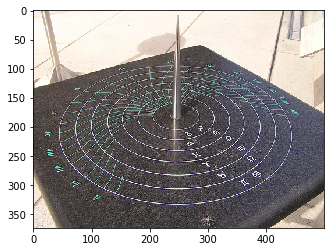

label: potter's_wheel, prob: 0.7179054021835327, predicted_label: potter's_wheel, influence: -828.5703125
error_similarity: -0.29740363359451294, encoding_similarity: 2786.0126953125
n03992509_568.JPEG


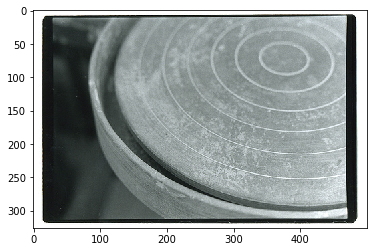

label: manhole_cover, prob: 0.954271674156189, predicted_label: manhole_cover, influence: -824.59375
error_similarity: -0.3539382815361023, encoding_similarity: 2329.76708984375
n03717622_8570.JPEG


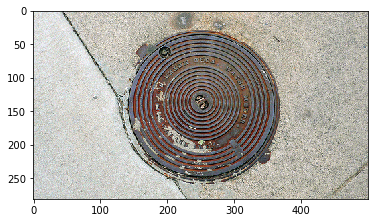

label: sundial, prob: 0.9999533891677856, predicted_label: sundial, influence: -795.8662719726562
error_similarity: -0.3317010700702667, encoding_similarity: 2399.347900390625
n04355338_327.JPEG


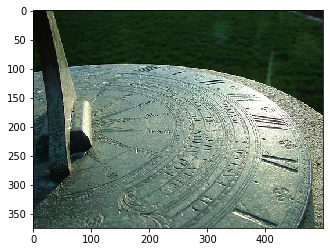

label: manhole_cover, prob: 0.9979573488235474, predicted_label: manhole_cover, influence: -777.803955078125
error_similarity: -0.3499203026294708, encoding_similarity: 2222.80322265625
n03717622_3637.JPEG


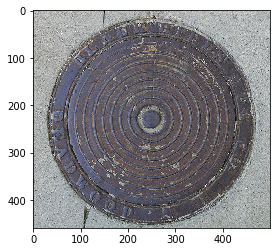

label: manhole_cover, prob: 0.9714239239692688, predicted_label: manhole_cover, influence: -743.5867309570312
error_similarity: -0.29487425088882446, encoding_similarity: 2521.7080078125
n03717622_12550.JPEG


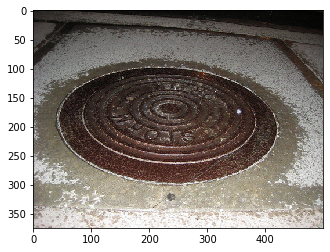

label: planetarium, prob: 0.4967242181301117, predicted_label: planetarium, influence: -730.5696411132812
error_similarity: -0.3047342598438263, encoding_similarity: 2397.399169921875
n03956157_10707.JPEG


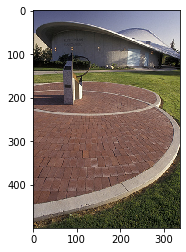

label: sundial, prob: 0.999966025352478, predicted_label: sundial, influence: -721.2432861328125
error_similarity: -0.2861829102039337, encoding_similarity: 2520.2177734375
n04355338_5550.JPEG


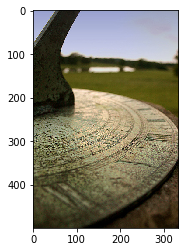

label: shield, prob: 0.9109310507774353, predicted_label: manhole_cover, influence: -713.8662719726562
error_similarity: -0.27075740694999695, encoding_similarity: 2636.552978515625
n04192698_45378.JPEG


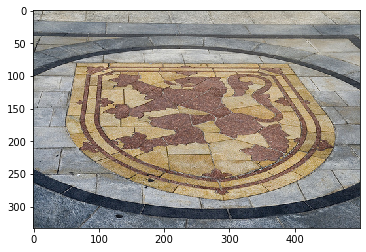

label: coil, prob: 0.9748221635818481, predicted_label: coil, influence: -648.5887451171875
error_similarity: -0.32244640588760376, encoding_similarity: 2011.462158203125
n03065424_37757.JPEG


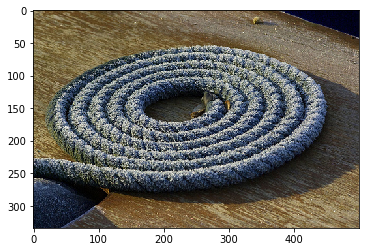

label: coil, prob: 0.9984344840049744, predicted_label: coil, influence: -628.9583129882812
error_similarity: -0.3391537368297577, encoding_similarity: 1854.4932861328125
n03065424_15618.JPEG


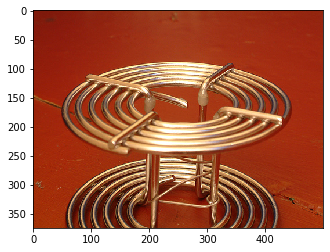

label: electric_fan, prob: 0.9992509484291077, predicted_label: electric_fan, influence: -626.9775390625
error_similarity: -0.2697634994983673, encoding_similarity: 2324.1748046875
n03271574_4391.JPEG


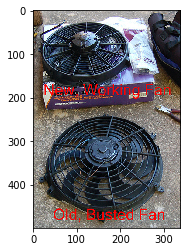

label: stupa, prob: 0.996562659740448, predicted_label: stupa, influence: -625.3535766601562
error_similarity: -0.33878228068351746, encoding_similarity: 1845.88623046875
n04346328_11948.JPEG


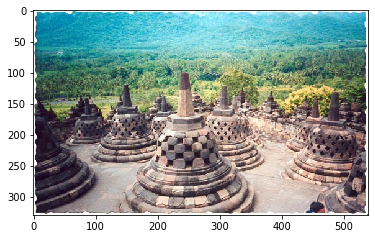

label: coil, prob: 0.9999045133590698, predicted_label: coil, influence: -594.283935546875
error_similarity: -0.3012339472770691, encoding_similarity: 1972.831787109375
n03065424_73421.JPEG


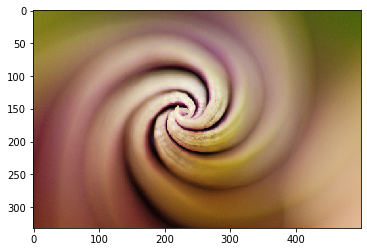

label: mousetrap, prob: 0.19537056982517242, predicted_label: mousetrap, influence: -574.2408447265625
error_similarity: -0.3530471622943878, encoding_similarity: 1626.5272216796875
n03794056_1003.JPEG


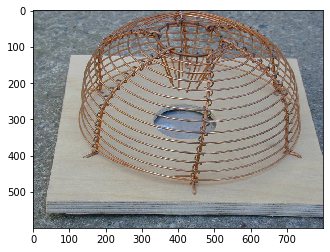

label: electric_fan, prob: 0.9623060822486877, predicted_label: electric_fan, influence: -568.4232788085938
error_similarity: -0.28983208537101746, encoding_similarity: 1961.2158203125
n03271574_16032.JPEG


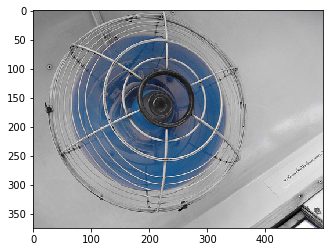

label: traffic_light, prob: 0.9722350835800171, predicted_label: traffic_light, influence: -565.7567138671875
error_similarity: -0.2841814458370209, encoding_similarity: 1990.8291015625
n06874185_22753.JPEG


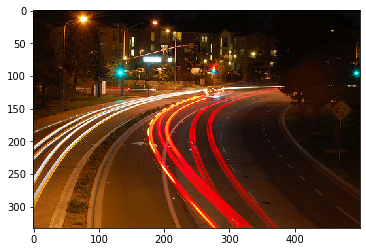

label: coil, prob: 0.8702660799026489, predicted_label: coil, influence: -536.7024536132812
error_similarity: -0.27204740047454834, encoding_similarity: 1972.826904296875
n03065424_19541.JPEG


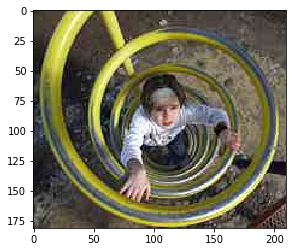

label: coil, prob: 0.9663643836975098, predicted_label: coil, influence: -529.935546875
error_similarity: -0.3243044912815094, encoding_similarity: 1634.06787109375
n03065424_11661.JPEG


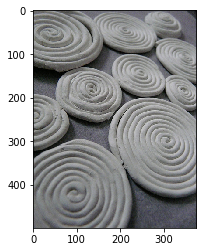

label: tile_roof, prob: 0.9762080907821655, predicted_label: tile_roof, influence: -527.3276977539062
error_similarity: -0.3151140511035919, encoding_similarity: 1673.4501953125
n04435653_2311.JPEG


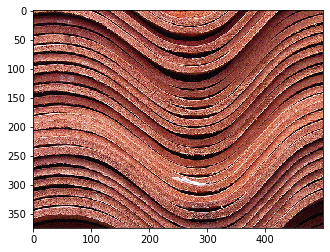

label: manhole_cover, prob: 0.9870593547821045, predicted_label: manhole_cover, influence: -520.6182250976562
error_similarity: -0.20976702868938446, encoding_similarity: 2481.8876953125
n03717622_5239.JPEG


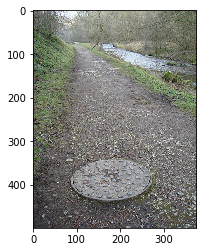

label: jigsaw_puzzle, prob: 0.937191903591156, predicted_label: jigsaw_puzzle, influence: -516.7803344726562
error_similarity: -0.3248693645000458, encoding_similarity: 1590.732666015625
n03598930_6893.JPEG


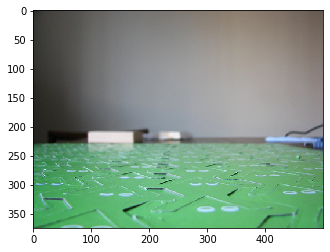

label: coil, prob: 0.9982600808143616, predicted_label: coil, influence: -515.166015625
error_similarity: -0.34727683663368225, encoding_similarity: 1483.44482421875
n03065424_11826.JPEG


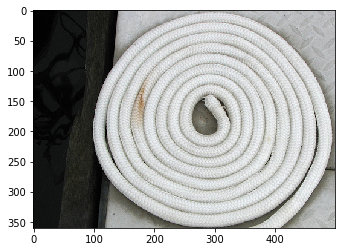

label: park_bench, prob: 0.9988723397254944, predicted_label: park_bench, influence: -509.998291015625
error_similarity: -0.27205991744995117, encoding_similarity: 1874.580810546875
n03891251_5212.JPEG


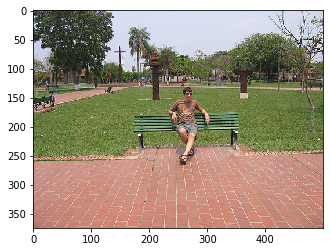

label: sundial, prob: 0.9998842477798462, predicted_label: sundial, influence: -504.05963134765625
error_similarity: -0.22246946394443512, encoding_similarity: 2265.74755859375
n04355338_24878.JPEG


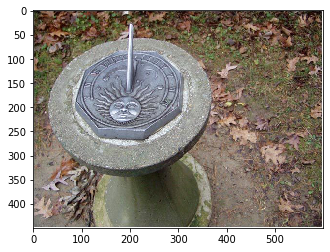

label: valley, prob: 0.28581055998802185, predicted_label: promontory, influence: -482.5436706542969
error_similarity: -0.3577926456928253, encoding_similarity: 1348.66845703125
n09468604_40956.JPEG


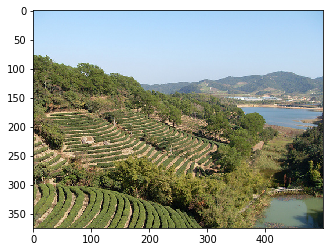

label: Petri_dish, prob: 0.9998422861099243, predicted_label: Petri_dish, influence: -482.17071533203125
error_similarity: -0.22340968251228333, encoding_similarity: 2158.235595703125
n03920288_2839.JPEG


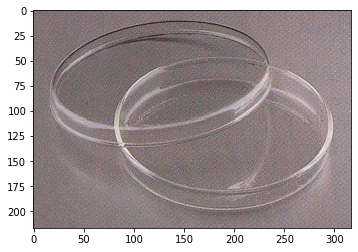

label: pedestal, prob: 0.4754839241504669, predicted_label: doormat, influence: -474.9444885253906
error_similarity: -0.3460473418235779, encoding_similarity: 1372.484130859375
n03903868_25610.JPEG


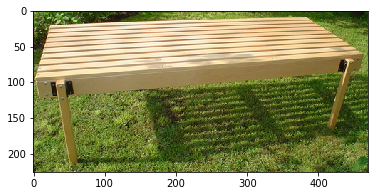

label: manhole_cover, prob: 0.9943200349807739, predicted_label: manhole_cover, influence: -466.572021484375
error_similarity: -0.20422199368476868, encoding_similarity: 2284.631591796875
n03717622_5372.JPEG


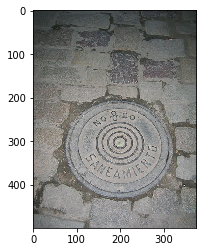

label: sombrero, prob: 0.9918649792671204, predicted_label: sombrero, influence: -425.5661926269531
error_similarity: -0.34579238295555115, encoding_similarity: 1230.6986083984375
n04259630_14617.JPEG


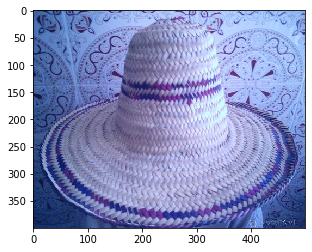

label: sundial, prob: 0.9574951529502869, predicted_label: sundial, influence: -425.1058654785156
error_similarity: -0.2274267077445984, encoding_similarity: 1869.199462890625
n04355338_9360.JPEG


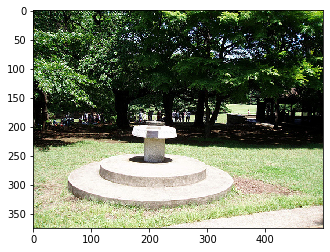

label: coil, prob: 0.4480285942554474, predicted_label: coil, influence: -395.7883605957031
error_similarity: -0.2109048217535019, encoding_similarity: 1876.6207275390625
n03065424_16181.JPEG


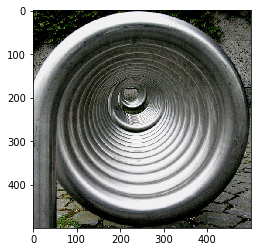

label: chest, prob: 0.2914515733718872, predicted_label: chest, influence: -391.9904479980469
error_similarity: -0.22826111316680908, encoding_similarity: 1717.2896728515625
n03014705_517.JPEG


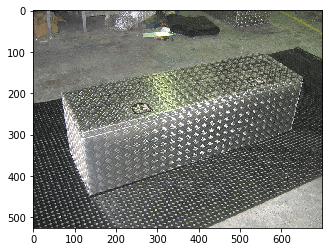

label: manhole_cover, prob: 0.99942946434021, predicted_label: manhole_cover, influence: -386.17669677734375
error_similarity: -0.17799849808216095, encoding_similarity: 2169.55029296875
n03717622_8798.JPEG


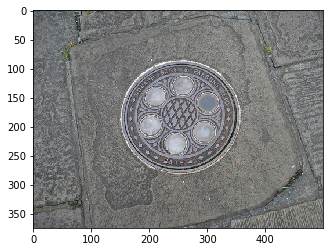

label: plate_rack, prob: 0.9991520643234253, predicted_label: plate_rack, influence: -384.9252624511719
error_similarity: -0.2892402410507202, encoding_similarity: 1330.8150634765625
n03961711_2154.JPEG


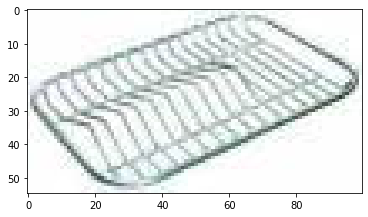

label: tile_roof, prob: 0.9999591112136841, predicted_label: tile_roof, influence: -368.0406188964844
error_similarity: -0.34240737557411194, encoding_similarity: 1074.86181640625
n04435653_5704.JPEG


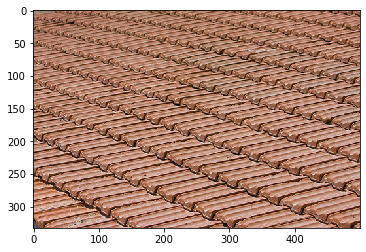

label: flatworm, prob: 0.9948619604110718, predicted_label: flatworm, influence: -360.5159606933594
error_similarity: -0.24078962206840515, encoding_similarity: 1497.223876953125
n01924916_8922.JPEG


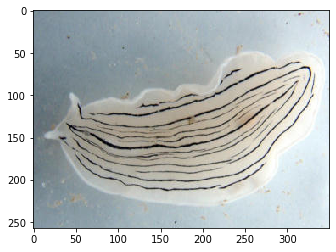

label: manhole_cover, prob: 0.9446725249290466, predicted_label: manhole_cover, influence: -360.0832824707031
error_similarity: -0.17442689836025238, encoding_similarity: 2064.37939453125
n03717622_2030.JPEG


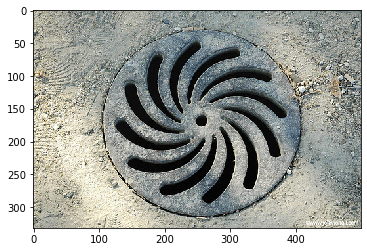

label: patio, prob: 0.9787828326225281, predicted_label: patio, influence: -358.5013122558594
error_similarity: -0.1586754322052002, encoding_similarity: 2259.337158203125
n03899768_124147.JPEG


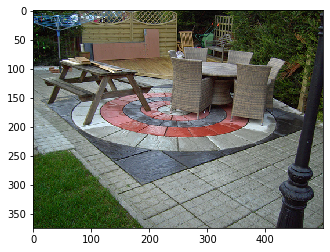

label: freight_car, prob: 0.5097141861915588, predicted_label: freight_car, influence: -357.0771484375
error_similarity: -0.17638449370861053, encoding_similarity: 2024.4248046875
n03393912_3681.JPEG


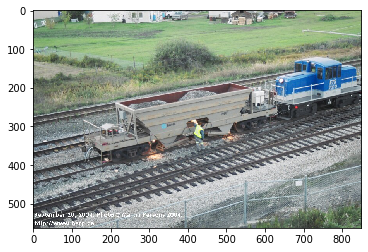

label: hair_slide, prob: 0.9311679601669312, predicted_label: hair_slide, influence: -355.55242919921875
error_similarity: -0.21649986505508423, encoding_similarity: 1642.2755126953125
n03476684_1043.JPEG


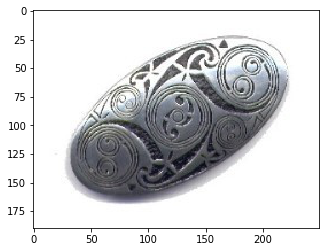

label: ringneck_snake, prob: 0.54215008020401, predicted_label: ringneck_snake, influence: -352.1289978027344
error_similarity: -0.2502846121788025, encoding_similarity: 1406.914306640625
n01728920_844.JPEG


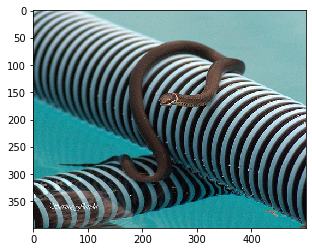

label: shopping_cart, prob: 0.41607096791267395, predicted_label: shopping_cart, influence: -350.6802673339844
error_similarity: -0.26665204763412476, encoding_similarity: 1315.123046875
n04204347_18601.JPEG


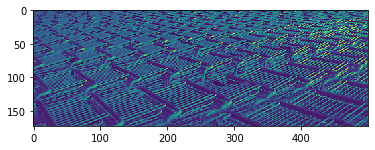

label: water_snake, prob: 0.9951501488685608, predicted_label: water_snake, influence: -325.6838073730469
error_similarity: -0.18257977068424225, encoding_similarity: 1783.7890625
n01737021_13033.JPEG


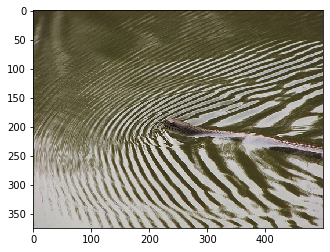

label: armadillo, prob: 0.4874940812587738, predicted_label: armadillo, influence: -323.5096435546875
error_similarity: -0.17608557641506195, encoding_similarity: 1837.229736328125
n02454379_887.JPEG


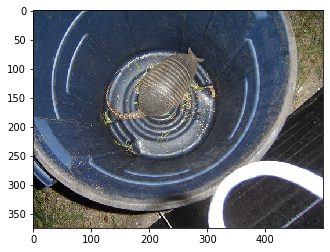

label: sombrero, prob: 0.999947190284729, predicted_label: sombrero, influence: -319.4755554199219
error_similarity: -0.1738283783197403, encoding_similarity: 1837.879150390625
n04259630_6447.JPEG


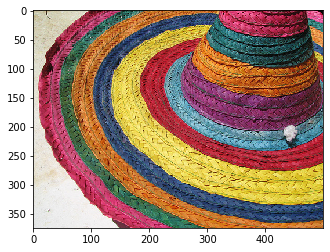

label: lawn_mower, prob: 0.19455423951148987, predicted_label: lawn_mower, influence: -315.3202819824219
error_similarity: -0.16716209053993225, encoding_similarity: 1886.314453125
n03649909_52397.JPEG


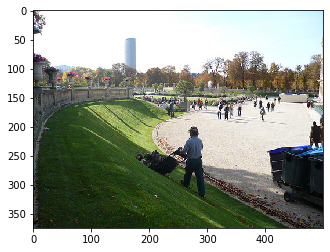

label: purse, prob: 0.829413652420044, predicted_label: purse, influence: -285.2043762207031
error_similarity: -0.1544693410396576, encoding_similarity: 1846.349365234375
n04026417_3923.JPEG


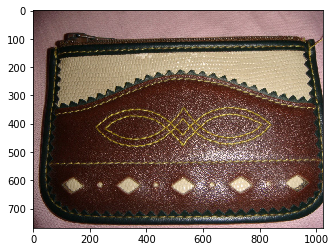

label: dishrag, prob: 0.991672158241272, predicted_label: dishrag, influence: -279.45953369140625
error_similarity: -0.3096748888492584, encoding_similarity: 902.4287719726562
n03207743_8892.JPEG


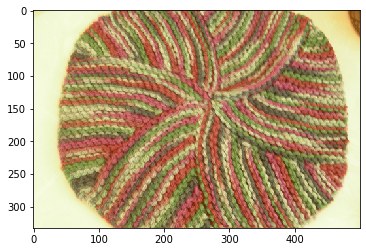

In [ ]:
find_and_show(trackin_val, 83, 'influence')